In [45]:
import os
import numpy as np
import geopandas as gpd
import pandas as pd
from shapely.geometry import Polygon
import geojson
import time
import pathlib

def load_path(dir_path):
    """list paths of all files under dir_path
    """

    file_list = os.listdir(dir_path)

    file_paths = []

    for filename in file_list:
        file_path = pathlib.Path(dir_path+filename)
        file_paths.append(str(file_path))

    return file_paths

def load_geojson(path):
    """load geojson features as dictionary from geojson file path
    """

    with open(path, "r") as input_file:
        geojson_dict = geojson.load(input_file)

    return geojson_dict

def prediction_filter_by_score(pred_dict, min_score):
    """filter predictions by score threshold
    """
    new_pred_dict = {}
    new_pred_dict['type'] = pred_dict['type']
    new_pred_dict['features'] = []
    for feature in pred_dict['features']:
        if feature['properties']['score'] >= min_score:
            new_pred_dict['features'].append(feature)

    return new_pred_dict

def prediction_to_gdf(dict):
    """convert prediction geojson dict to geodataframe
    """
    geo_series_list = []
    (left, bottom, right, top) = (10.1926319999999997,5.6555059999999999, 10.2352519999999991,5.6722060000000001)
    ref_extend = Polygon([(left, top), (left, bottom), (right, bottom), (right, top), (left, top)]) 
    id = 0
    for i, feature in enumerate(dict['features']):       
        pred_polygon = Polygon(feature['geometry']['coordinates'][0])
        if(ref_extend.contains(pred_polygon)):
            geo_series = {
                'task_id': feature['properties']['task_id'],
                'score': feature['properties']['score'],
                'prediction_id': id,
                'type': feature['geometry']['type'],
                'if_correct': False,
                'geometry': pred_polygon
            }
            geo_series_list.append(geo_series)
            id += 1
        else:
            continue
    geo_df = gpd.GeoDataFrame(geo_series_list)

    return geo_df

def reference_to_gdf(dict):
    """convert reference geojson dict to geodataframe
    """
    geo_series_list = []
    for i, feature in enumerate(dict['features']):
        geo_series = {
            'ref_id': i,
#             'label': feature['properties']['label'],
            'type': feature['geometry']['type'],
            'if_detected': False,
            'geometry': get_bbox(Polygon(feature['geometry']['coordinates'][0]))
        }
        geo_series_list.append(geo_series)
    geo_df = gpd.GeoDataFrame(geo_series_list)
    
    return geo_df

def get_bbox(geometry):
    """ get bbox of geometry
    """
    xmin, ymin, xmax, ymax = geometry.bounds
    bbox_polygon = Polygon.from_bounds(xmin, ymin, xmax, ymax)
    
    return bbox_polygon

# def intersection_gdf(gdf1, gdf2):
#     """find intersected geometry between two geo dataframe
#     """
    
# #     intersection = gdf1.geometry.overlaps(gdf2.geometry, align=True)
#     intersection_gdf = gpd.overlay(gdf1, gdf2, how='intersection')
#     print("intersection: \n", intersection_gdf['properties_1'])
    
#     gdf1.plot()
#     gdf2.plot()
#     intersection_gdf.plot()
    
#     return intersection_gdf

def calculate_IOU(box1, box2):
    """Calculate IOU between two boxes
    """
    intersect_df = gpd.overlay(box1, box2, how="intersection")
    
    union_df = gpd.overlay(box1, box2, how="union")
    union_df = union_df.dissolve()
    
    iou = intersect_df.area / union_df.area
    
    return iou.iloc[0]

pred_geodf                task_id     score  prediction_id     type  if_correct  \
0     18.138494.126934  0.080912              0  Polygon       False   
1     18.138494.126935  0.962957              1  Polygon       False   
2     18.138494.126935  0.857490              2  Polygon       False   
3     18.138494.126935  0.747513              3  Polygon       False   
4     18.138494.126935  0.545376              4  Polygon       False   
...                ...       ...            ...      ...         ...   
1732  18.138524.126945  0.080254           1732  Polygon       False   
1733  18.138524.126946  0.999163           1733  Polygon       False   
1734  18.138524.126946  0.774584           1734  Polygon       False   
1735  18.138524.126946  0.744504           1735  Polygon       False   
1736  18.138524.126946  0.549584           1736  Polygon       False   

                                               geometry  
0     POLYGON ((10.19297 5.67216, 10.19314 5.67216, ...  
1     PO

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: UserWarning: `keep_geom_type=True` in overlay resulted in 14 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries


intersection: 
                task_id     score  prediction_id   type_1  if_correct  ref_id  \
0     18.138494.126934  0.080912              0  Polygon       False    1787   
1     18.138494.126935  0.747513              3  Polygon       False    1787   
2     18.138494.126935  0.962957              1  Polygon       False    1785   
3     18.138494.126935  0.747513              3  Polygon       False    1785   
4     18.138494.126935  0.545376              4  Polygon       False    1785   
...                ...       ...            ...      ...         ...     ...   
2163  18.138524.126946  0.999163           1733  Polygon       False    1551   
2164  18.138524.126946  0.774584           1734  Polygon       False    1769   
2165  18.138524.126946  0.744504           1735  Polygon       False    1767   
2166  18.138524.126946  0.744504           1735  Polygon       False    1768   
2167  18.138524.126946  0.549584           1736  Polygon       False    1770   

       type_2  if_detec

20 Pandas(Index=20, task_id='18.138494.126935', score=0.3645490992038307, prediction_id=6, type_1='Polygon', if_correct=False, ref_id=1786, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c42b6780>)
6    True
Name: if_correct, dtype: bool
1786    True
Name: if_detected, dtype: bool
21 Pandas(Index=21, task_id='18.138494.126935', score=0.3603507062871167, prediction_id=7, type_1='Polygon', if_correct=False, ref_id=1792, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c42b6908>)


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:658: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


7    True
Name: if_correct, dtype: bool
1792    True
Name: if_detected, dtype: bool
22 Pandas(Index=22, task_id='18.138494.126935', score=0.3276436050592407, prediction_id=9, type_1='Polygon', if_correct=False, ref_id=1792, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c42b6240>)
9    False
Name: if_correct, dtype: bool
1792    True
Name: if_detected, dtype: bool
23 Pandas(Index=23, task_id='18.138494.126935', score=0.3603507062871167, prediction_id=7, type_1='Polygon', if_correct=False, ref_id=1793, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c42b65f8>)
7    True
Name: if_correct, dtype: bool
1793    False
Name: if_detected, dtype: bool
24 Pandas(Index=24, task_id='18.138494.126935', score=0.3276436050592407, prediction_id=9, type_1='Polygon', if_correct=False, ref_id=1793, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c42b6a90>)
9    

26    True
Name: if_correct, dtype: bool
285    True
Name: if_detected, dtype: bool
47 Pandas(Index=47, task_id='18.138494.126945', score=0.1314803203085041, prediction_id=27, type_1='Polygon', if_correct=False, ref_id=330, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6710630>)
27    True
Name: if_correct, dtype: bool
330    True
Name: if_detected, dtype: bool
48 Pandas(Index=48, task_id='18.138494.126946', score=0.669940197967119, prediction_id=28, type_1='Polygon', if_correct=False, ref_id=326, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6710ba8>)
28    True
Name: if_correct, dtype: bool
326    True
Name: if_detected, dtype: bool
49 Pandas(Index=49, task_id='18.138494.126946', score=0.1292761905339502, prediction_id=30, type_1='Polygon', if_correct=False, ref_id=326, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6710208>)
30    Tr

49    True
Name: if_correct, dtype: bool
257    True
Name: if_detected, dtype: bool
72 Pandas(Index=72, task_id='18.138495.126941', score=0.8580762659356752, prediction_id=50, type_1='Polygon', if_correct=False, ref_id=246, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6710be0>)
50    True
Name: if_correct, dtype: bool
246    True
Name: if_detected, dtype: bool
73 Pandas(Index=73, task_id='18.138495.126941', score=0.10332897534858411, prediction_id=55, type_1='Polygon', if_correct=False, ref_id=246, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6710dd8>)
55    True
Name: if_correct, dtype: bool
246    True
Name: if_detected, dtype: bool
74 Pandas(Index=74, task_id='18.138495.126941', score=0.09886196796997743, prediction_id=56, type_1='Polygon', if_correct=False, ref_id=246, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6710438>)
56   

68    True
Name: if_correct, dtype: bool
287    True
Name: if_detected, dtype: bool
98 Pandas(Index=98, task_id='18.138495.126942', score=0.44373921028428776, prediction_id=63, type_1='Polygon', if_correct=False, ref_id=288, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c67108d0>)
63    True
Name: if_correct, dtype: bool
288    True
Name: if_detected, dtype: bool
99 Pandas(Index=99, task_id='18.138495.126942', score=0.07356873103483588, prediction_id=70, type_1='Polygon', if_correct=False, ref_id=264, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c67101d0>)
70    True
Name: if_correct, dtype: bool
264    True
Name: if_detected, dtype: bool
100 Pandas(Index=100, task_id='18.138495.126943', score=0.2445913719058122, prediction_id=71, type_1='Polygon', if_correct=False, ref_id=337, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6710b00>)
71 

94    True
Name: if_correct, dtype: bool
250    True
Name: if_detected, dtype: bool
124 Pandas(Index=124, task_id='18.138496.126941', score=0.7842196314971231, prediction_id=96, type_1='Polygon', if_correct=False, ref_id=250, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c72d0b38>)
96    False
Name: if_correct, dtype: bool
250    True
Name: if_detected, dtype: bool
125 Pandas(Index=125, task_id='18.138496.126941', score=0.07346312929634048, prediction_id=103, type_1='Polygon', if_correct=False, ref_id=250, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c72d07b8>)
103    False
Name: if_correct, dtype: bool
250    True
Name: if_detected, dtype: bool
126 Pandas(Index=126, task_id='18.138496.126941', score=0.9985945224761963, prediction_id=94, type_1='Polygon', if_correct=False, ref_id=251, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c72d0cf

108    True
Name: if_correct, dtype: bool
345    True
Name: if_detected, dtype: bool
149 Pandas(Index=149, task_id='18.138496.126943', score=0.6152017180195355, prediction_id=110, type_1='Polygon', if_correct=False, ref_id=345, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c72d0fd0>)
110    True
Name: if_correct, dtype: bool
345    True
Name: if_detected, dtype: bool
150 Pandas(Index=150, task_id='18.138496.126943', score=0.20046131462202454, prediction_id=111, type_1='Polygon', if_correct=False, ref_id=346, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c72d0e10>)
111    True
Name: if_correct, dtype: bool
346    True
Name: if_detected, dtype: bool
151 Pandas(Index=151, task_id='18.138496.126943', score=0.1957584112566591, prediction_id=112, type_1='Polygon', if_correct=False, ref_id=346, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c72d0

175 Pandas(Index=175, task_id='18.138496.126946', score=0.591176479915969, prediction_id=125, type_1='Polygon', if_correct=False, ref_id=369, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c72d0ac8>)
125    True
Name: if_correct, dtype: bool
369    True
Name: if_detected, dtype: bool
176 Pandas(Index=176, task_id='18.138496.126946', score=0.5842682329000072, prediction_id=126, type_1='Polygon', if_correct=False, ref_id=373, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c72d0cc0>)
126    True
Name: if_correct, dtype: bool
373    True
Name: if_detected, dtype: bool
177 Pandas(Index=177, task_id='18.138496.126946', score=0.1734772881833325, prediction_id=127, type_1='Polygon', if_correct=False, ref_id=374, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c72d0518>)
127    True
Name: if_correct, dtype: bool
374    True
Name: if_detected, dtype: b

150    True
Name: if_correct, dtype: bool
139    True
Name: if_detected, dtype: bool
201 Pandas(Index=201, task_id='18.138497.126940', score=0.9476072757010028, prediction_id=151, type_1='Polygon', if_correct=False, ref_id=142, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c539a5f8>)
151    True
Name: if_correct, dtype: bool
142    True
Name: if_detected, dtype: bool
202 Pandas(Index=202, task_id='18.138497.126941', score=0.8207362528092575, prediction_id=152, type_1='Polygon', if_correct=False, ref_id=272, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c539afd0>)
152    True
Name: if_correct, dtype: bool
272    True
Name: if_detected, dtype: bool
203 Pandas(Index=203, task_id='18.138497.126941', score=0.10412648242617784, prediction_id=154, type_1='Polygon', if_correct=False, ref_id=272, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c539a

173    True
Name: if_correct, dtype: bool
18    True
Name: if_detected, dtype: bool
226 Pandas(Index=226, task_id='18.138498.126936', score=0.7686456448957633, prediction_id=176, type_1='Polygon', if_correct=False, ref_id=73, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c539a978>)
176    True
Name: if_correct, dtype: bool
73    True
Name: if_detected, dtype: bool
227 Pandas(Index=227, task_id='18.138498.126937', score=0.99968022108078, prediction_id=177, type_1='Polygon', if_correct=False, ref_id=96, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c539aa20>)
177    True
Name: if_correct, dtype: bool
96    True
Name: if_detected, dtype: bool
228 Pandas(Index=228, task_id='18.138498.126937', score=0.8293546392453587, prediction_id=178, type_1='Polygon', if_correct=False, ref_id=98, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c539a828>)
178

197    True
Name: if_correct, dtype: bool
277    True
Name: if_detected, dtype: bool
251 Pandas(Index=251, task_id='18.138498.126941', score=0.08075696078037972, prediction_id=198, type_1='Polygon', if_correct=False, ref_id=283, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55c6ba8>)
198    True
Name: if_correct, dtype: bool
283    True
Name: if_detected, dtype: bool
252 Pandas(Index=252, task_id='18.138498.126942', score=0.9710175395011902, prediction_id=199, type_1='Polygon', if_correct=False, ref_id=283, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55c64e0>)
199    True
Name: if_correct, dtype: bool
283    True
Name: if_detected, dtype: bool
253 Pandas(Index=253, task_id='18.138498.126942', score=0.07809852338117276, prediction_id=203, type_1='Polygon', if_correct=False, ref_id=283, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55c

214    False
Name: if_correct, dtype: bool
391    False
Name: if_detected, dtype: bool
277 Pandas(Index=277, task_id='18.138498.126944', score=0.782322108745575, prediction_id=218, type_1='Polygon', if_correct=False, ref_id=391, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55c6518>)
218    True
Name: if_correct, dtype: bool
391    False
Name: if_detected, dtype: bool
278 Pandas(Index=278, task_id='18.138498.126944', score=0.9950922131538391, prediction_id=214, type_1='Polygon', if_correct=False, ref_id=392, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55c6e48>)
214    True
Name: if_correct, dtype: bool
392    True
Name: if_detected, dtype: bool
279 Pandas(Index=279, task_id='18.138498.126944', score=0.9890583753585815, prediction_id=215, type_1='Polygon', if_correct=False, ref_id=387, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55c

237    True
Name: if_correct, dtype: bool
380    True
Name: if_detected, dtype: bool
303 Pandas(Index=303, task_id='18.138498.126946', score=0.892137080218098, prediction_id=239, type_1='Polygon', if_correct=False, ref_id=382, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c60fc438>)
239    True
Name: if_correct, dtype: bool
382    True
Name: if_detected, dtype: bool
304 Pandas(Index=304, task_id='18.138498.126946', score=0.6465292633954045, prediction_id=240, type_1='Polygon', if_correct=False, ref_id=406, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c60fc7b8>)
240    True
Name: if_correct, dtype: bool
406    True
Name: if_detected, dtype: bool
305 Pandas(Index=305, task_id='18.138498.126946', score=0.10186628552967777, prediction_id=241, type_1='Polygon', if_correct=False, ref_id=381, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c60fcb

328 Pandas(Index=328, task_id='18.138499.126940', score=0.1387039215347527, prediction_id=256, type_1='Polygon', if_correct=False, ref_id=229, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c60fc5c0>)
256    True
Name: if_correct, dtype: bool
229    True
Name: if_detected, dtype: bool
329 Pandas(Index=329, task_id='18.138499.126940', score=0.25084666160206015, prediction_id=255, type_1='Polygon', if_correct=False, ref_id=232, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c60fc710>)
255    True
Name: if_correct, dtype: bool
232    True
Name: if_detected, dtype: bool
330 Pandas(Index=330, task_id='18.138499.126941', score=0.10194991604797335, prediction_id=261, type_1='Polygon', if_correct=False, ref_id=232, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c60fc080>)
261    True
Name: if_correct, dtype: bool
232    True
Name: if_detected, dtype

271    False
Name: if_correct, dtype: bool
423    False
Name: if_detected, dtype: bool
354 Pandas(Index=354, task_id='18.138499.126945', score=0.6944156413713082, prediction_id=273, type_1='Polygon', if_correct=False, ref_id=423, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f654e0>)
273    True
Name: if_correct, dtype: bool
423    True
Name: if_detected, dtype: bool
355 Pandas(Index=355, task_id='18.138499.126945', score=0.184234373226324, prediction_id=275, type_1='Polygon', if_correct=False, ref_id=423, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f65320>)
275    True
Name: if_correct, dtype: bool
423    True
Name: if_detected, dtype: bool
356 Pandas(Index=356, task_id='18.138499.126945', score=0.15009150886712105, prediction_id=276, type_1='Polygon', if_correct=False, ref_id=423, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f6

287    True
Name: if_correct, dtype: bool
44    False
Name: if_detected, dtype: bool
379 Pandas(Index=379, task_id='18.138500.126935', score=0.5730014500901907, prediction_id=288, type_1='Polygon', if_correct=False, ref_id=44, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f655f8>)
288    True
Name: if_correct, dtype: bool
44    True
Name: if_detected, dtype: bool
380 Pandas(Index=380, task_id='18.138500.126935', score=0.6699110129353933, prediction_id=287, type_1='Polygon', if_correct=False, ref_id=45, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f65eb8>)
287    True
Name: if_correct, dtype: bool
45    False
Name: if_detected, dtype: bool
381 Pandas(Index=381, task_id='18.138500.126935', score=0.5730014500901907, prediction_id=288, type_1='Polygon', if_correct=False, ref_id=45, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f656d8>)

310    True
Name: if_correct, dtype: bool
306    True
Name: if_detected, dtype: bool
404 Pandas(Index=404, task_id='18.138500.126941', score=0.749660074710846, prediction_id=305, type_1='Polygon', if_correct=False, ref_id=308, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f65d30>)
305    True
Name: if_correct, dtype: bool
308    True
Name: if_detected, dtype: bool
405 Pandas(Index=405, task_id='18.138500.126941', score=0.5091643989712616, prediction_id=307, type_1='Polygon', if_correct=False, ref_id=239, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f650f0>)
307    True
Name: if_correct, dtype: bool
239    True
Name: if_detected, dtype: bool
406 Pandas(Index=406, task_id='18.138500.126941', score=0.5091643989712616, prediction_id=307, type_1='Polygon', if_correct=False, ref_id=240, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f653c

429 Pandas(Index=429, task_id='18.138500.126944', score=0.26355503348106507, prediction_id=332, type_1='Polygon', if_correct=False, ref_id=527, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c666eac8>)
332    True
Name: if_correct, dtype: bool
527    True
Name: if_detected, dtype: bool
430 Pandas(Index=430, task_id='18.138500.126944', score=0.42219536951975056, prediction_id=331, type_1='Polygon', if_correct=False, ref_id=528, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c666e3c8>)
331    True
Name: if_correct, dtype: bool
528    True
Name: if_detected, dtype: bool
431 Pandas(Index=431, task_id='18.138500.126944', score=0.08107625647367532, prediction_id=333, type_1='Polygon', if_correct=False, ref_id=480, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c666e748>)
333    True
Name: if_correct, dtype: bool
480    True
Name: if_detected, dtyp

354    True
Name: if_correct, dtype: bool
52    True
Name: if_detected, dtype: bool
455 Pandas(Index=455, task_id='18.138501.126935', score=0.8619322625353468, prediction_id=350, type_1='Polygon', if_correct=False, ref_id=40, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c666ecc0>)
350    True
Name: if_correct, dtype: bool
40    True
Name: if_detected, dtype: bool
456 Pandas(Index=456, task_id='18.138501.126935', score=0.8612000716855136, prediction_id=351, type_1='Polygon', if_correct=False, ref_id=36, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c666ef28>)
351    True
Name: if_correct, dtype: bool
36    True
Name: if_detected, dtype: bool
457 Pandas(Index=457, task_id='18.138501.126935', score=0.8612000716855136, prediction_id=351, type_1='Polygon', if_correct=False, ref_id=37, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c666ed68>)
3

480 Pandas(Index=480, task_id='18.138501.126936', score=0.3218694094594737, prediction_id=367, type_1='Polygon', if_correct=False, ref_id=77, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c666e710>)
367    True
Name: if_correct, dtype: bool
77    True
Name: if_detected, dtype: bool
481 Pandas(Index=481, task_id='18.138501.126936', score=0.26921712664248215, prediction_id=369, type_1='Polygon', if_correct=False, ref_id=108, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c666e048>)
369    True
Name: if_correct, dtype: bool
108    True
Name: if_detected, dtype: bool
482 Pandas(Index=482, task_id='18.138501.126936', score=0.15979171149496954, prediction_id=370, type_1='Polygon', if_correct=False, ref_id=176, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c666e358>)
370    True
Name: if_correct, dtype: bool
176    True
Name: if_detected, dtype: 

505 Pandas(Index=505, task_id='18.138501.126940', score=0.12121753246535433, prediction_id=386, type_1='Polygon', if_correct=False, ref_id=222, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55e3a20>)
386    True
Name: if_correct, dtype: bool
222    True
Name: if_detected, dtype: bool
506 Pandas(Index=506, task_id='18.138501.126941', score=0.7417147322431958, prediction_id=388, type_1='Polygon', if_correct=False, ref_id=455, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55e3240>)
388    True
Name: if_correct, dtype: bool
455    True
Name: if_detected, dtype: bool
507 Pandas(Index=507, task_id='18.138501.126941', score=0.09839003620914738, prediction_id=389, type_1='Polygon', if_correct=False, ref_id=454, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55e3710>)
389    True
Name: if_correct, dtype: bool
454    True
Name: if_detected, dtype

411    True
Name: if_correct, dtype: bool
79    True
Name: if_detected, dtype: bool
531 Pandas(Index=531, task_id='18.138502.126936', score=0.924753725528717, prediction_id=412, type_1='Polygon', if_correct=False, ref_id=188, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55e3ac8>)
412    True
Name: if_correct, dtype: bool
188    True
Name: if_detected, dtype: bool
532 Pandas(Index=532, task_id='18.138502.126936', score=0.7531983059110191, prediction_id=413, type_1='Polygon', if_correct=False, ref_id=109, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55e30f0>)
413    True
Name: if_correct, dtype: bool
109    True
Name: if_detected, dtype: bool
533 Pandas(Index=533, task_id='18.138502.126936', score=0.11684643133926478, prediction_id=418, type_1='Polygon', if_correct=False, ref_id=109, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55e36a

556 Pandas(Index=556, task_id='18.138502.126940', score=0.9893350601196289, prediction_id=431, type_1='Polygon', if_correct=False, ref_id=216, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c85ea5c0>)
431    True
Name: if_correct, dtype: bool
216    True
Name: if_detected, dtype: bool
557 Pandas(Index=557, task_id='18.138502.126940', score=0.8786875605583191, prediction_id=432, type_1='Polygon', if_correct=False, ref_id=221, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c85eada0>)
432    True
Name: if_correct, dtype: bool
221    True
Name: if_detected, dtype: bool
558 Pandas(Index=558, task_id='18.138502.126940', score=0.8138424754142761, prediction_id=433, type_1='Polygon', if_correct=False, ref_id=217, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c85ea358>)
433    True
Name: if_correct, dtype: bool
217    True
Name: if_detected, dtype: 

454    True
Name: if_correct, dtype: bool
195    True
Name: if_detected, dtype: bool
582 Pandas(Index=582, task_id='18.138503.126938', score=0.2136331054542131, prediction_id=456, type_1='Polygon', if_correct=False, ref_id=199, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c85ea0b8>)
456    True
Name: if_correct, dtype: bool
199    True
Name: if_detected, dtype: bool
583 Pandas(Index=583, task_id='18.138503.126938', score=0.15455939221142365, prediction_id=457, type_1='Polygon', if_correct=False, ref_id=199, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c85ea160>)
457    True
Name: if_correct, dtype: bool
199    True
Name: if_detected, dtype: bool
584 Pandas(Index=584, task_id='18.138503.126939', score=0.9744729399681091, prediction_id=458, type_1='Polygon', if_correct=False, ref_id=211, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c85ea

607 Pandas(Index=607, task_id='18.138503.126945', score=0.7479187099885172, prediction_id=477, type_1='Polygon', if_correct=False, ref_id=500, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c85eae48>)
477    False
Name: if_correct, dtype: bool
500    False
Name: if_detected, dtype: bool
608 Pandas(Index=608, task_id='18.138503.126945', score=0.08849845590893304, prediction_id=483, type_1='Polygon', if_correct=False, ref_id=500, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c85ea898>)
483    True
Name: if_correct, dtype: bool
500    True
Name: if_detected, dtype: bool
609 Pandas(Index=609, task_id='18.138503.126945', score=0.7479187099885172, prediction_id=477, type_1='Polygon', if_correct=False, ref_id=501, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c85ea978>)
477    True
Name: if_correct, dtype: bool
501    True
Name: if_detected, dtyp

493    True
Name: if_correct, dtype: bool
535    True
Name: if_detected, dtype: bool
633 Pandas(Index=633, task_id='18.138504.126936', score=0.8611510757885695, prediction_id=495, type_1='Polygon', if_correct=False, ref_id=553, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6889780>)
495    True
Name: if_correct, dtype: bool
553    True
Name: if_detected, dtype: bool
634 Pandas(Index=634, task_id='18.138504.126936', score=0.736850531126764, prediction_id=496, type_1='Polygon', if_correct=False, ref_id=560, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c68898d0>)
496    True
Name: if_correct, dtype: bool
560    True
Name: if_detected, dtype: bool
635 Pandas(Index=635, task_id='18.138504.126936', score=0.1159093074226385, prediction_id=501, type_1='Polygon', if_correct=False, ref_id=560, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6889c5

512    False
Name: if_correct, dtype: bool
774    False
Name: if_detected, dtype: bool
658 Pandas(Index=658, task_id='18.138504.126940', score=0.10252244262219437, prediction_id=512, type_1='Polygon', if_correct=False, ref_id=775, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6889ba8>)
512    True
Name: if_correct, dtype: bool
775    True
Name: if_detected, dtype: bool
659 Pandas(Index=659, task_id='18.138504.126941', score=0.9335697849732509, prediction_id=513, type_1='Polygon', if_correct=False, ref_id=891, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c68895c0>)
513    True
Name: if_correct, dtype: bool
891    True
Name: if_detected, dtype: bool
660 Pandas(Index=660, task_id='18.138504.126941', score=0.8465465141264507, prediction_id=514, type_1='Polygon', if_correct=False, ref_id=894, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c68

527    True
Name: if_correct, dtype: bool
890    True
Name: if_detected, dtype: bool
684 Pandas(Index=684, task_id='18.138504.126941', score=0.2724708723494783, prediction_id=528, type_1='Polygon', if_correct=False, ref_id=898, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6889668>)
528    True
Name: if_correct, dtype: bool
898    True
Name: if_detected, dtype: bool
685 Pandas(Index=685, task_id='18.138504.126942', score=0.9974252581596375, prediction_id=538, type_1='Polygon', if_correct=False, ref_id=908, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6889898>)
538    True
Name: if_correct, dtype: bool
908    True
Name: if_detected, dtype: bool
686 Pandas(Index=686, task_id='18.138504.126942', score=0.4137939282287191, prediction_id=541, type_1='Polygon', if_correct=False, ref_id=908, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6889c

709 Pandas(Index=709, task_id='18.138504.126946', score=0.4183671229221533, prediction_id=559, type_1='Polygon', if_correct=False, ref_id=523, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55ca240>)
559    True
Name: if_correct, dtype: bool
523    True
Name: if_detected, dtype: bool
710 Pandas(Index=710, task_id='18.138505.126935', score=0.9957903027534485, prediction_id=561, type_1='Polygon', if_correct=False, ref_id=543, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55ca4a8>)
561    False
Name: if_correct, dtype: bool
543    False
Name: if_detected, dtype: bool
711 Pandas(Index=711, task_id='18.138505.126935', score=0.9957903027534485, prediction_id=561, type_1='Polygon', if_correct=False, ref_id=544, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55ca5f8>)
561    True
Name: if_correct, dtype: bool
544    True
Name: if_detected, dtype

734 Pandas(Index=734, task_id='18.138505.126936', score=0.9313633401014412, prediction_id=572, type_1='Polygon', if_correct=False, ref_id=565, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55ca588>)
572    False
Name: if_correct, dtype: bool
565    False
Name: if_detected, dtype: bool
735 Pandas(Index=735, task_id='18.138505.126936', score=0.19241728046462148, prediction_id=579, type_1='Polygon', if_correct=False, ref_id=565, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55ca400>)
579    True
Name: if_correct, dtype: bool
565    True
Name: if_detected, dtype: bool
736 Pandas(Index=736, task_id='18.138505.126936', score=0.9313633401014412, prediction_id=572, type_1='Polygon', if_correct=False, ref_id=566, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55cae80>)
572    True
Name: if_correct, dtype: bool
566    True
Name: if_detected, dtyp

596    True
Name: if_correct, dtype: bool
770    True
Name: if_detected, dtype: bool
760 Pandas(Index=760, task_id='18.138505.126939', score=0.08446766102749859, prediction_id=597, type_1='Polygon', if_correct=False, ref_id=766, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55cada0>)
597    True
Name: if_correct, dtype: bool
766    True
Name: if_detected, dtype: bool
761 Pandas(Index=761, task_id='18.138505.126940', score=0.14776891249762605, prediction_id=598, type_1='Polygon', if_correct=False, ref_id=913, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55cad68>)
598    True
Name: if_correct, dtype: bool
913    True
Name: if_detected, dtype: bool
762 Pandas(Index=762, task_id='18.138505.126941', score=0.6224385345915382, prediction_id=602, type_1='Polygon', if_correct=False, ref_id=913, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c55c

626    False
Name: if_correct, dtype: bool
550    True
Name: if_detected, dtype: bool
786 Pandas(Index=786, task_id='18.138506.126935', score=0.07011693493113895, prediction_id=631, type_1='Polygon', if_correct=False, ref_id=550, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c97fc198>)
631    False
Name: if_correct, dtype: bool
550    True
Name: if_detected, dtype: bool
787 Pandas(Index=787, task_id='18.138506.126935', score=0.9403067898384583, prediction_id=620, type_1='Polygon', if_correct=False, ref_id=552, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c97fc780>)
620    True
Name: if_correct, dtype: bool
552    True
Name: if_detected, dtype: bool
788 Pandas(Index=788, task_id='18.138506.126935', score=0.07011693493113895, prediction_id=631, type_1='Polygon', if_correct=False, ref_id=552, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c9

643    True
Name: if_correct, dtype: bool
794    True
Name: if_detected, dtype: bool
812 Pandas(Index=812, task_id='18.138506.126940', score=0.324734920706865, prediction_id=644, type_1='Polygon', if_correct=False, ref_id=787, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c97fc358>)
644    True
Name: if_correct, dtype: bool
787    True
Name: if_detected, dtype: bool
813 Pandas(Index=813, task_id='18.138506.126940', score=0.09042261899343523, prediction_id=646, type_1='Polygon', if_correct=False, ref_id=789, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c97fc748>)
646    False
Name: if_correct, dtype: bool
789    False
Name: if_detected, dtype: bool
814 Pandas(Index=814, task_id='18.138506.126940', score=0.09042261899343523, prediction_id=646, type_1='Polygon', if_correct=False, ref_id=790, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c56

665    True
Name: if_correct, dtype: bool
1023    True
Name: if_detected, dtype: bool
837 Pandas(Index=837, task_id='18.138506.126945', score=0.15342876543743558, prediction_id=669, type_1='Polygon', if_correct=False, ref_id=1023, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c56309e8>)
669    True
Name: if_correct, dtype: bool
1023    True
Name: if_detected, dtype: bool
838 Pandas(Index=838, task_id='18.138506.126945', score=0.08938433809893484, prediction_id=670, type_1='Polygon', if_correct=False, ref_id=1023, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5630e10>)
670    True
Name: if_correct, dtype: bool
1023    True
Name: if_detected, dtype: bool
839 Pandas(Index=839, task_id='18.138507.126945', score=0.2086282046312499, prediction_id=728, type_1='Polygon', if_correct=False, ref_id=1023, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f

862 Pandas(Index=862, task_id='18.138507.126935', score=0.8527473965473953, prediction_id=682, type_1='Polygon', if_correct=False, ref_id=596, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4295208>)
682    True
Name: if_correct, dtype: bool
596    True
Name: if_detected, dtype: bool
863 Pandas(Index=863, task_id='18.138507.126935', score=0.3429684603142682, prediction_id=686, type_1='Polygon', if_correct=False, ref_id=596, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4295f28>)
686    False
Name: if_correct, dtype: bool
596    True
Name: if_detected, dtype: bool
864 Pandas(Index=864, task_id='18.138507.126935', score=0.37192820387901343, prediction_id=684, type_1='Polygon', if_correct=False, ref_id=593, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4295400>)
684    True
Name: if_correct, dtype: bool
593    True
Name: if_detected, dtype

705    True
Name: if_correct, dtype: bool
817    True
Name: if_detected, dtype: bool
888 Pandas(Index=888, task_id='18.138507.126939', score=0.08460440846170082, prediction_id=706, type_1='Polygon', if_correct=False, ref_id=805, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4295e10>)
706    True
Name: if_correct, dtype: bool
805    True
Name: if_detected, dtype: bool
889 Pandas(Index=889, task_id='18.138507.126940', score=0.6153899917653377, prediction_id=708, type_1='Polygon', if_correct=False, ref_id=804, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c42954e0>)
708    True
Name: if_correct, dtype: bool
804    True
Name: if_detected, dtype: bool
890 Pandas(Index=890, task_id='18.138507.126940', score=0.1180175393819809, prediction_id=709, type_1='Polygon', if_correct=False, ref_id=796, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4295

913 Pandas(Index=913, task_id='18.138507.126946', score=0.5934730520503899, prediction_id=734, type_1='Polygon', if_correct=False, ref_id=961, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5d51710>)
734    True
Name: if_correct, dtype: bool
961    True
Name: if_detected, dtype: bool
914 Pandas(Index=914, task_id='18.138507.126946', score=0.970283567905426, prediction_id=730, type_1='Polygon', if_correct=False, ref_id=963, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5d51668>)
730    True
Name: if_correct, dtype: bool
963    True
Name: if_detected, dtype: bool
915 Pandas(Index=915, task_id='18.138507.126946', score=0.5934730520503899, prediction_id=734, type_1='Polygon', if_correct=False, ref_id=963, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5d51c88>)
734    True
Name: if_correct, dtype: bool
963    True
Name: if_detected, dtype: b

749    True
Name: if_correct, dtype: bool
599    True
Name: if_detected, dtype: bool
939 Pandas(Index=939, task_id='18.138508.126935', score=0.8399002844947898, prediction_id=745, type_1='Polygon', if_correct=False, ref_id=600, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c7fdfa90>)
745    True
Name: if_correct, dtype: bool
600    True
Name: if_detected, dtype: bool
940 Pandas(Index=940, task_id='18.138508.126935', score=0.537717264505155, prediction_id=747, type_1='Polygon', if_correct=False, ref_id=600, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c7fdf550>)
747    False
Name: if_correct, dtype: bool
600    True
Name: if_detected, dtype: bool
941 Pandas(Index=941, task_id='18.138508.126935', score=0.2072981324186508, prediction_id=749, type_1='Polygon', if_correct=False, ref_id=600, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c7fdf1

767    True
Name: if_correct, dtype: bool
850    True
Name: if_detected, dtype: bool
965 Pandas(Index=965, task_id='18.138508.126940', score=0.3107266141303832, prediction_id=768, type_1='Polygon', if_correct=False, ref_id=849, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca5659b0>)
768    True
Name: if_correct, dtype: bool
849    False
Name: if_detected, dtype: bool
966 Pandas(Index=966, task_id='18.138508.126940', score=0.09089511881911527, prediction_id=770, type_1='Polygon', if_correct=False, ref_id=849, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca565f98>)
770    True
Name: if_correct, dtype: bool
849    True
Name: if_detected, dtype: bool
967 Pandas(Index=967, task_id='18.138508.126940', score=0.18432685641930915, prediction_id=769, type_1='Polygon', if_correct=False, ref_id=851, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca5

787    True
Name: if_correct, dtype: bool
836    True
Name: if_detected, dtype: bool
991 Pandas(Index=991, task_id='18.138509.126939', score=0.17908403345418578, prediction_id=795, type_1='Polygon', if_correct=False, ref_id=836, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca5656a0>)
795    True
Name: if_correct, dtype: bool
836    True
Name: if_detected, dtype: bool
992 Pandas(Index=992, task_id='18.138510.126939', score=0.08914446482441622, prediction_id=874, type_1='Polygon', if_correct=False, ref_id=836, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca565358>)
874    False
Name: if_correct, dtype: bool
836    True
Name: if_detected, dtype: bool
993 Pandas(Index=993, task_id='18.138509.126939', score=0.9815607666969299, prediction_id=788, type_1='Polygon', if_correct=False, ref_id=825, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca5

807    True
Name: if_correct, dtype: bool
1043    True
Name: if_detected, dtype: bool
1017 Pandas(Index=1017, task_id='18.138509.126941', score=0.17512245452636677, prediction_id=808, type_1='Polygon', if_correct=False, ref_id=1043, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca5650f0>)
808    True
Name: if_correct, dtype: bool
1043    True
Name: if_detected, dtype: bool
1018 Pandas(Index=1018, task_id='18.138509.126941', score=0.15978999435901642, prediction_id=809, type_1='Polygon', if_correct=False, ref_id=1043, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca565a90>)
809    True
Name: if_correct, dtype: bool
1043    True
Name: if_detected, dtype: bool
1019 Pandas(Index=1019, task_id='18.138509.126941', score=0.07807448173555542, prediction_id=810, type_1='Polygon', if_correct=False, ref_id=1043, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object 

1041 Pandas(Index=1041, task_id='18.138510.126935', score=0.9924859404563904, prediction_id=826, type_1='Polygon', if_correct=False, ref_id=635, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02cc22ecc0>)
826    False
Name: if_correct, dtype: bool
635    False
Name: if_detected, dtype: bool
1042 Pandas(Index=1042, task_id='18.138510.126935', score=0.6519430803005439, prediction_id=834, type_1='Polygon', if_correct=False, ref_id=635, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02cc22ee48>)
834    True
Name: if_correct, dtype: bool
635    True
Name: if_detected, dtype: bool
1043 Pandas(Index=1043, task_id='18.138510.126935', score=0.6205195864315268, prediction_id=837, type_1='Polygon', if_correct=False, ref_id=635, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02cc22e4a8>)
837    True
Name: if_correct, dtype: bool
635    True
Name: if_detected,

1066 Pandas(Index=1066, task_id='18.138510.126935', score=0.4607764840070644, prediction_id=839, type_1='Polygon', if_correct=False, ref_id=618, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02cd0227f0>)
839    True
Name: if_correct, dtype: bool
618    True
Name: if_detected, dtype: bool
1067 Pandas(Index=1067, task_id='18.138510.126935', score=0.31068492416703825, prediction_id=845, type_1='Polygon', if_correct=False, ref_id=618, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02cd022208>)
845    False
Name: if_correct, dtype: bool
618    True
Name: if_detected, dtype: bool
1068 Pandas(Index=1068, task_id='18.138510.126935', score=0.21305104690848156, prediction_id=852, type_1='Polygon', if_correct=False, ref_id=618, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02cd0229b0>)
852    False
Name: if_correct, dtype: bool
618    True
Name: if_detecte

843    True
Name: if_correct, dtype: bool
623    True
Name: if_detected, dtype: bool
1091 Pandas(Index=1091, task_id='18.138510.126935', score=0.3219778084013367, prediction_id=844, type_1='Polygon', if_correct=False, ref_id=623, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5672f98>)
844    True
Name: if_correct, dtype: bool
623    True
Name: if_detected, dtype: bool
1092 Pandas(Index=1092, task_id='18.138510.126935', score=0.08209044805419818, prediction_id=859, type_1='Polygon', if_correct=False, ref_id=623, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5672a20>)
859    True
Name: if_correct, dtype: bool
623    True
Name: if_detected, dtype: bool
1093 Pandas(Index=1093, task_id='18.138510.126935', score=0.6272806889093518, prediction_id=836, type_1='Polygon', if_correct=False, ref_id=614, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f0

1115 Pandas(Index=1115, task_id='18.138510.126940', score=0.998888730870334, prediction_id=876, type_1='Polygon', if_correct=False, ref_id=862, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8e56d8>)
876    True
Name: if_correct, dtype: bool
862    True
Name: if_detected, dtype: bool
1116 Pandas(Index=1116, task_id='18.138510.126940', score=0.8522464031910275, prediction_id=878, type_1='Polygon', if_correct=False, ref_id=859, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8e5080>)
878    True
Name: if_correct, dtype: bool
859    True
Name: if_detected, dtype: bool
1117 Pandas(Index=1117, task_id='18.138510.126940', score=0.8497737787936221, prediction_id=879, type_1='Polygon', if_correct=False, ref_id=860, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8e5e80>)
879    True
Name: if_correct, dtype: bool
860    True
Name: if_detected, dt

1140 Pandas(Index=1140, task_id='18.138510.126942', score=0.13464915907309413, prediction_id=895, type_1='Polygon', if_correct=False, ref_id=1051, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8e5208>)
895    True
Name: if_correct, dtype: bool
1051    True
Name: if_detected, dtype: bool
1141 Pandas(Index=1141, task_id='18.138510.126944', score=0.17195310709717507, prediction_id=896, type_1='Polygon', if_correct=False, ref_id=1087, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8e5c50>)
896    True
Name: if_correct, dtype: bool
1087    True
Name: if_detected, dtype: bool
1142 Pandas(Index=1142, task_id='18.138510.126945', score=0.9816716909408569, prediction_id=897, type_1='Polygon', if_correct=False, ref_id=1082, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8e5ba8>)
897    True
Name: if_correct, dtype: bool
1082    True
Name: if_det

921    True
Name: if_correct, dtype: bool
749    True
Name: if_detected, dtype: bool
1166 Pandas(Index=1166, task_id='18.138511.126938', score=0.11474215898927312, prediction_id=922, type_1='Polygon', if_correct=False, ref_id=750, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8e5b70>)
922    True
Name: if_correct, dtype: bool
750    True
Name: if_detected, dtype: bool
1167 Pandas(Index=1167, task_id='18.138511.126939', score=0.9970825910568237, prediction_id=923, type_1='Polygon', if_correct=False, ref_id=865, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8e5b00>)
923    True
Name: if_correct, dtype: bool
865    True
Name: if_detected, dtype: bool
1168 Pandas(Index=1168, task_id='18.138511.126939', score=0.9479257464408875, prediction_id=924, type_1='Polygon', if_correct=False, ref_id=865, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f0

1191 Pandas(Index=1191, task_id='18.138511.126940', score=0.106135242478067, prediction_id=941, type_1='Polygon', if_correct=False, ref_id=883, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6d9ed30>)
941    True
Name: if_correct, dtype: bool
883    True
Name: if_detected, dtype: bool
1192 Pandas(Index=1192, task_id='18.138511.126940', score=0.29154090595291215, prediction_id=938, type_1='Polygon', if_correct=False, ref_id=884, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6d9eba8>)
938    True
Name: if_correct, dtype: bool
884    True
Name: if_detected, dtype: bool
1193 Pandas(Index=1193, task_id='18.138511.126940', score=0.15327499237916803, prediction_id=940, type_1='Polygon', if_correct=False, ref_id=884, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6d9e400>)
940    True
Name: if_correct, dtype: bool
884    True
Name: if_detected, 

960    True
Name: if_correct, dtype: bool
1090    True
Name: if_detected, dtype: bool
1217 Pandas(Index=1217, task_id='18.138511.126944', score=0.07454264023021973, prediction_id=961, type_1='Polygon', if_correct=False, ref_id=1090, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6d9e978>)
961    True
Name: if_correct, dtype: bool
1090    True
Name: if_detected, dtype: bool
1218 Pandas(Index=1218, task_id='18.138511.126945', score=0.9385726451873779, prediction_id=962, type_1='Polygon', if_correct=False, ref_id=1099, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6d9e240>)
962    False
Name: if_correct, dtype: bool
1099    False
Name: if_detected, dtype: bool
1219 Pandas(Index=1219, task_id='18.138511.126945', score=0.25841414253745143, prediction_id=971, type_1='Polygon', if_correct=False, ref_id=1099, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object

1242 Pandas(Index=1242, task_id='18.138512.126946', score=0.07337851617917865, prediction_id=1048, type_1='Polygon', if_correct=False, ref_id=1093, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6d9e6d8>)
1048    True
Name: if_correct, dtype: bool
1093    True
Name: if_detected, dtype: bool
1243 Pandas(Index=1243, task_id='18.138511.126946', score=0.2284274033180653, prediction_id=980, type_1='Polygon', if_correct=False, ref_id=1094, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6d9e128>)
980    True
Name: if_correct, dtype: bool
1094    True
Name: if_detected, dtype: bool
1244 Pandas(Index=1244, task_id='18.138512.126935', score=0.9676594714915437, prediction_id=981, type_1='Polygon', if_correct=False, ref_id=658, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6d9e438>)
981    True
Name: if_correct, dtype: bool
658    True
Name: if_dete

1267 Pandas(Index=1267, task_id='18.138512.126937', score=0.8647469878196716, prediction_id=994, type_1='Polygon', if_correct=False, ref_id=721, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5162080>)
994    True
Name: if_correct, dtype: bool
721    True
Name: if_detected, dtype: bool
1268 Pandas(Index=1268, task_id='18.138512.126938', score=0.2387975170584278, prediction_id=1006, type_1='Polygon', if_correct=False, ref_id=721, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5162c88>)
1006    True
Name: if_correct, dtype: bool
721    True
Name: if_detected, dtype: bool
1269 Pandas(Index=1269, task_id='18.138512.126937', score=0.8595102311644273, prediction_id=995, type_1='Polygon', if_correct=False, ref_id=693, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5162ba8>)
995    True
Name: if_correct, dtype: bool
693    True
Name: if_detected,

1013    True
Name: if_correct, dtype: bool
1198    True
Name: if_detected, dtype: bool
1292 Pandas(Index=1292, task_id='18.138512.126942', score=0.0772143387808594, prediction_id=1014, type_1='Polygon', if_correct=False, ref_id=1196, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c57aed68>)
1014    True
Name: if_correct, dtype: bool
1196    True
Name: if_detected, dtype: bool
1293 Pandas(Index=1293, task_id='18.138512.126943', score=0.9050524774225043, prediction_id=1015, type_1='Polygon', if_correct=False, ref_id=1177, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c60862b0>)
1015    True
Name: if_correct, dtype: bool
1177    True
Name: if_detected, dtype: bool
1294 Pandas(Index=1294, task_id='18.138512.126943', score=0.8632943186835098, prediction_id=1016, type_1='Polygon', if_correct=False, ref_id=1179, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon obje

1316 Pandas(Index=1316, task_id='18.138512.126945', score=0.9959163069725037, prediction_id=1035, type_1='Polygon', if_correct=False, ref_id=1107, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c60868d0>)
1035    True
Name: if_correct, dtype: bool
1107    True
Name: if_detected, dtype: bool
1317 Pandas(Index=1317, task_id='18.138512.126945', score=0.6514295904280224, prediction_id=1042, type_1='Polygon', if_correct=False, ref_id=1107, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6086630>)
1042    False
Name: if_correct, dtype: bool
1107    True
Name: if_detected, dtype: bool
1318 Pandas(Index=1318, task_id='18.138512.126945', score=0.9803116917610168, prediction_id=1036, type_1='Polygon', if_correct=False, ref_id=1131, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6086c88>)
1036    True
Name: if_correct, dtype: bool
1131    True
Name: i

1058    True
Name: if_correct, dtype: bool
685    True
Name: if_detected, dtype: bool
1342 Pandas(Index=1342, task_id='18.138513.126937', score=0.5560028277923019, prediction_id=1069, type_1='Polygon', if_correct=False, ref_id=685, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5c580f0>)
1069    True
Name: if_correct, dtype: bool
685    True
Name: if_detected, dtype: bool
1343 Pandas(Index=1343, task_id='18.138513.126937', score=0.9047719779474722, prediction_id=1059, type_1='Polygon', if_correct=False, ref_id=681, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5c58b00>)
1059    True
Name: if_correct, dtype: bool
681    True
Name: if_detected, dtype: bool
1344 Pandas(Index=1344, task_id='18.138513.126937', score=0.8030823351789913, prediction_id=1063, type_1='Polygon', if_correct=False, ref_id=681, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 

1366 Pandas(Index=1366, task_id='18.138513.126938', score=0.8038897324428154, prediction_id=1075, type_1='Polygon', if_correct=False, ref_id=716, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5c58860>)
1075    True
Name: if_correct, dtype: bool
716    True
Name: if_detected, dtype: bool
1367 Pandas(Index=1367, task_id='18.138513.126938', score=0.5499660841063339, prediction_id=1076, type_1='Polygon', if_correct=False, ref_id=716, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5c58e80>)
1076    True
Name: if_correct, dtype: bool
716    True
Name: if_detected, dtype: bool
1368 Pandas(Index=1368, task_id='18.138513.126938', score=0.48405818736366585, prediction_id=1077, type_1='Polygon', if_correct=False, ref_id=716, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5c587b8>)
1077    True
Name: if_correct, dtype: bool
716    True
Name: if_dete

1101    True
Name: if_correct, dtype: bool
1200    True
Name: if_detected, dtype: bool
1391 Pandas(Index=1391, task_id='18.138513.126942', score=0.09439223385532751, prediction_id=1102, type_1='Polygon', if_correct=False, ref_id=1204, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5c58ba8>)
1102    True
Name: if_correct, dtype: bool
1204    True
Name: if_detected, dtype: bool
1392 Pandas(Index=1392, task_id='18.138514.126942', score=0.974288284778595, prediction_id=1191, type_1='Polygon', if_correct=False, ref_id=1204, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5c58a58>)
1191    True
Name: if_correct, dtype: bool
1204    True
Name: if_detected, dtype: bool
1393 Pandas(Index=1393, task_id='18.138513.126942', score=0.08184340265603238, prediction_id=1103, type_1='Polygon', if_correct=False, ref_id=1195, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon obj

1124    False
Name: if_correct, dtype: bool
1160    True
Name: if_detected, dtype: bool
1415 Pandas(Index=1415, task_id='18.138513.126943', score=0.6289350799043453, prediction_id=1112, type_1='Polygon', if_correct=False, ref_id=1161, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c56adbe0>)
1112    True
Name: if_correct, dtype: bool
1161    False
Name: if_detected, dtype: bool
1416 Pandas(Index=1416, task_id='18.138513.126943', score=0.08682538952153374, prediction_id=1120, type_1='Polygon', if_correct=False, ref_id=1161, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c56ad278>)
1120    True
Name: if_correct, dtype: bool
1161    True
Name: if_detected, dtype: bool
1417 Pandas(Index=1417, task_id='18.138513.126943', score=0.6084389626940725, prediction_id=1113, type_1='Polygon', if_correct=False, ref_id=1192, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon o

1440 Pandas(Index=1440, task_id='18.138514.126935', score=0.1591411679983139, prediction_id=1145, type_1='Polygon', if_correct=False, ref_id=663, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c51ac1d0>)
1145    False
Name: if_correct, dtype: bool
663    True
Name: if_detected, dtype: bool
1441 Pandas(Index=1441, task_id='18.138514.126935', score=0.23145095048108988, prediction_id=1141, type_1='Polygon', if_correct=False, ref_id=664, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c51ac128>)
1141    True
Name: if_correct, dtype: bool
664    False
Name: if_detected, dtype: bool
1442 Pandas(Index=1442, task_id='18.138514.126935', score=0.1591411679983139, prediction_id=1145, type_1='Polygon', if_correct=False, ref_id=664, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c51ac630>)
1145    True
Name: if_correct, dtype: bool
664    True
Name: if_de

1465 Pandas(Index=1465, task_id='18.138514.126937', score=0.6764131957077019, prediction_id=1161, type_1='Polygon', if_correct=False, ref_id=679, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c51acbe0>)
1161    True
Name: if_correct, dtype: bool
679    True
Name: if_detected, dtype: bool
1466 Pandas(Index=1466, task_id='18.138514.126937', score=0.9998273253440857, prediction_id=1156, type_1='Polygon', if_correct=False, ref_id=680, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c51ac320>)
1156    True
Name: if_correct, dtype: bool
680    True
Name: if_detected, dtype: bool
1467 Pandas(Index=1467, task_id='18.138514.126937', score=0.6764131957077019, prediction_id=1161, type_1='Polygon', if_correct=False, ref_id=680, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4add7b8>)
1161    True
Name: if_correct, dtype: bool
680    True
Name: if_detec

1490 Pandas(Index=1490, task_id='18.138514.126938', score=0.4652746851090749, prediction_id=1175, type_1='Polygon', if_correct=False, ref_id=1245, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4add898>)
1175    True
Name: if_correct, dtype: bool
1245    True
Name: if_detected, dtype: bool
1491 Pandas(Index=1491, task_id='18.138514.126939', score=0.9644483327865601, prediction_id=1178, type_1='Polygon', if_correct=False, ref_id=741, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4add550>)
1178    True
Name: if_correct, dtype: bool
741    True
Name: if_detected, dtype: bool
1492 Pandas(Index=1492, task_id='18.138514.126939', score=0.07901019650241636, prediction_id=1185, type_1='Polygon', if_correct=False, ref_id=741, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4addf98>)
1185    False
Name: if_correct, dtype: bool
741    True
Name: if_d

1515 Pandas(Index=1515, task_id='18.138514.126944', score=0.9179951548576355, prediction_id=1200, type_1='Polygon', if_correct=False, ref_id=1140, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4add198>)
1200    True
Name: if_correct, dtype: bool
1140    True
Name: if_detected, dtype: bool
1516 Pandas(Index=1516, task_id='18.138514.126944', score=0.8512861874392197, prediction_id=1201, type_1='Polygon', if_correct=False, ref_id=1155, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4addcc0>)
1201    True
Name: if_correct, dtype: bool
1155    True
Name: if_detected, dtype: bool
1517 Pandas(Index=1517, task_id='18.138514.126944', score=0.33787005911806534, prediction_id=1202, type_1='Polygon', if_correct=False, ref_id=1156, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4add278>)
1202    True
Name: if_correct, dtype: bool
1156    True
Name: i

1540 Pandas(Index=1540, task_id='18.138515.126935', score=0.8639118776032267, prediction_id=1215, type_1='Polygon', if_correct=False, ref_id=1236, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c550ae10>)
1215    True
Name: if_correct, dtype: bool
1236    True
Name: if_detected, dtype: bool
1541 Pandas(Index=1541, task_id='18.138515.126936', score=0.7022012145639189, prediction_id=1220, type_1='Polygon', if_correct=False, ref_id=1238, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c550a2e8>)
1220    True
Name: if_correct, dtype: bool
1238    True
Name: if_detected, dtype: bool
1542 Pandas(Index=1542, task_id='18.138515.126936', score=0.5804816196432797, prediction_id=1221, type_1='Polygon', if_correct=False, ref_id=1250, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c550a160>)
1221    True
Name: if_correct, dtype: bool
1250    True
Name: if

1564 Pandas(Index=1564, task_id='18.138515.126938', score=0.38644940444446, prediction_id=1235, type_1='Polygon', if_correct=False, ref_id=1275, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02cb988588>)
1235    True
Name: if_correct, dtype: bool
1275    True
Name: if_detected, dtype: bool
1565 Pandas(Index=1565, task_id='18.138515.126939', score=0.9921448230743408, prediction_id=1236, type_1='Polygon', if_correct=False, ref_id=1276, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02cb988a90>)
1236    True
Name: if_correct, dtype: bool
1276    True
Name: if_detected, dtype: bool
1566 Pandas(Index=1566, task_id='18.138515.126939', score=0.9862358570098877, prediction_id=1237, type_1='Polygon', if_correct=False, ref_id=1280, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02cb9889b0>)
1237    True
Name: if_correct, dtype: bool
1280    True
Name: if_d

1256    True
Name: if_correct, dtype: bool
1449    True
Name: if_detected, dtype: bool
1589 Pandas(Index=1589, task_id='18.138515.126942', score=0.855206415033068, prediction_id=1258, type_1='Polygon', if_correct=False, ref_id=1470, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6eda898>)
1258    True
Name: if_correct, dtype: bool
1470    True
Name: if_detected, dtype: bool
1590 Pandas(Index=1590, task_id='18.138515.126943', score=0.6923164278277275, prediction_id=1259, type_1='Polygon', if_correct=False, ref_id=1511, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6edafd0>)
1259    True
Name: if_correct, dtype: bool
1511    True
Name: if_detected, dtype: bool
1591 Pandas(Index=1591, task_id='18.138515.126943', score=0.6901519355899345, prediction_id=1260, type_1='Polygon', if_correct=False, ref_id=1515, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon objec

1277    True
Name: if_correct, dtype: bool
1256    True
Name: if_detected, dtype: bool
1614 Pandas(Index=1614, task_id='18.138516.126936', score=0.39271503130322183, prediction_id=1278, type_1='Polygon', if_correct=False, ref_id=1295, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6f6a7b8>)
1278    True
Name: if_correct, dtype: bool
1295    True
Name: if_detected, dtype: bool
1615 Pandas(Index=1615, task_id='18.138516.126936', score=0.20440339589943027, prediction_id=1279, type_1='Polygon', if_correct=False, ref_id=1298, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6f6acf8>)
1279    True
Name: if_correct, dtype: bool
1298    True
Name: if_detected, dtype: bool
1616 Pandas(Index=1616, task_id='18.138516.126936', score=0.1231643703182412, prediction_id=1281, type_1='Polygon', if_correct=False, ref_id=1296, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon ob

1303    True
Name: if_correct, dtype: bool
1567    True
Name: if_detected, dtype: bool
1638 Pandas(Index=1638, task_id='18.138516.126943', score=0.6584544894062551, prediction_id=1304, type_1='Polygon', if_correct=False, ref_id=1569, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c62f9518>)
1304    True
Name: if_correct, dtype: bool
1569    True
Name: if_detected, dtype: bool
1639 Pandas(Index=1639, task_id='18.138516.126943', score=0.6158503361572726, prediction_id=1305, type_1='Polygon', if_correct=False, ref_id=1552, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c62f9128>)
1305    True
Name: if_correct, dtype: bool
1552    True
Name: if_detected, dtype: bool
1640 Pandas(Index=1640, task_id='18.138516.126944', score=0.9279552102088928, prediction_id=1310, type_1='Polygon', if_correct=False, ref_id=1552, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon obje

1662 Pandas(Index=1662, task_id='18.138516.126945', score=0.12608045144069022, prediction_id=1321, type_1='Polygon', if_correct=False, ref_id=1525, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c62f9438>)
1321    False
Name: if_correct, dtype: bool
1525    True
Name: if_detected, dtype: bool
1663 Pandas(Index=1663, task_id='18.138516.126945', score=0.33432413455364485, prediction_id=1320, type_1='Polygon', if_correct=False, ref_id=1526, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c62f9c88>)
1320    True
Name: if_correct, dtype: bool
1526    False
Name: if_detected, dtype: bool
1664 Pandas(Index=1664, task_id='18.138516.126945', score=0.12608045144069022, prediction_id=1321, type_1='Polygon', if_correct=False, ref_id=1526, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c62f9780>)
1321    True
Name: if_correct, dtype: bool
1526    True
Nam

1687 Pandas(Index=1687, task_id='18.138517.126935', score=0.26250972328642375, prediction_id=1337, type_1='Polygon', if_correct=False, ref_id=1318, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c62f90f0>)
1337    True
Name: if_correct, dtype: bool
1318    True
Name: if_detected, dtype: bool
1688 Pandas(Index=1688, task_id='18.138517.126936', score=0.41262534367120984, prediction_id=1339, type_1='Polygon', if_correct=False, ref_id=1311, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c62f9198>)
1339    True
Name: if_correct, dtype: bool
1311    True
Name: if_detected, dtype: bool
1689 Pandas(Index=1689, task_id='18.138517.126936', score=0.3316947990685421, prediction_id=1340, type_1='Polygon', if_correct=False, ref_id=1313, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c62f99e8>)
1340    True
Name: if_correct, dtype: bool
1313    True
Name: 

1711 Pandas(Index=1711, task_id='18.138517.126937', score=0.4217706361347939, prediction_id=1351, type_1='Polygon', if_correct=False, ref_id=1305, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c510d390>)
1351    True
Name: if_correct, dtype: bool
1305    True
Name: if_detected, dtype: bool
1712 Pandas(Index=1712, task_id='18.138518.126937', score=0.9636598229408264, prediction_id=1408, type_1='Polygon', if_correct=False, ref_id=1305, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c510d240>)
1408    False
Name: if_correct, dtype: bool
1305    True
Name: if_detected, dtype: bool
1713 Pandas(Index=1713, task_id='18.138517.126937', score=0.18441101664180043, prediction_id=1353, type_1='Polygon', if_correct=False, ref_id=1310, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c510d710>)
1353    True
Name: if_correct, dtype: bool
1310    True
Name: 

1735 Pandas(Index=1735, task_id='18.138517.126943', score=0.1896088376338019, prediction_id=1382, type_1='Polygon', if_correct=False, ref_id=1576, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c510def0>)
1382    True
Name: if_correct, dtype: bool
1576    True
Name: if_detected, dtype: bool
1736 Pandas(Index=1736, task_id='18.138517.126943', score=0.9871163368225098, prediction_id=1370, type_1='Polygon', if_correct=False, ref_id=1577, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c510d828>)
1370    True
Name: if_correct, dtype: bool
1577    True
Name: if_detected, dtype: bool
1737 Pandas(Index=1737, task_id='18.138517.126943', score=0.1896088376338019, prediction_id=1382, type_1='Polygon', if_correct=False, ref_id=1577, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c510db38>)
1382    True
Name: if_correct, dtype: bool
1577    True
Name: if

1760 Pandas(Index=1760, task_id='18.138517.126943', score=0.0896553064746943, prediction_id=1384, type_1='Polygon', if_correct=False, ref_id=1564, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f3b518>)
1384    True
Name: if_correct, dtype: bool
1564    True
Name: if_detected, dtype: bool
1761 Pandas(Index=1761, task_id='18.138517.126944', score=0.9663456678390503, prediction_id=1385, type_1='Polygon', if_correct=False, ref_id=1558, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f3be10>)
1385    True
Name: if_correct, dtype: bool
1558    False
Name: if_detected, dtype: bool
1762 Pandas(Index=1762, task_id='18.138517.126944', score=0.28752873736763457, prediction_id=1387, type_1='Polygon', if_correct=False, ref_id=1558, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f3b4e0>)
1387    True
Name: if_correct, dtype: bool
1558    True
Name: 

1417    True
Name: if_correct, dtype: bool
1306    True
Name: if_detected, dtype: bool
1785 Pandas(Index=1785, task_id='18.138518.126937', score=0.07468715413495207, prediction_id=1420, type_1='Polygon', if_correct=False, ref_id=1306, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f3bdd8>)
1420    True
Name: if_correct, dtype: bool
1306    True
Name: if_detected, dtype: bool
1786 Pandas(Index=1786, task_id='18.138518.126938', score=0.8944920301437378, prediction_id=1424, type_1='Polygon', if_correct=False, ref_id=1306, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f3b668>)
1424    True
Name: if_correct, dtype: bool
1306    True
Name: if_detected, dtype: bool
1787 Pandas(Index=1787, task_id='18.138518.126938', score=0.30883701397479835, prediction_id=1426, type_1='Polygon', if_correct=False, ref_id=1306, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon ob

1809 Pandas(Index=1809, task_id='18.138518.126941', score=0.13399742847749962, prediction_id=1431, type_1='Polygon', if_correct=False, ref_id=1486, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f3b128>)
1431    False
Name: if_correct, dtype: bool
1486    False
Name: if_detected, dtype: bool
1810 Pandas(Index=1810, task_id='18.138518.126941', score=0.13399742847749962, prediction_id=1431, type_1='Polygon', if_correct=False, ref_id=1489, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f3bf60>)
1431    True
Name: if_correct, dtype: bool
1489    True
Name: if_detected, dtype: bool
1811 Pandas(Index=1811, task_id='18.138518.126941', score=0.08431427339689446, prediction_id=1432, type_1='Polygon', if_correct=False, ref_id=1491, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f3b1d0>)
1432    True
Name: if_correct, dtype: bool
1491    True
Nam

1833 Pandas(Index=1833, task_id='18.138518.126944', score=0.29356326534827343, prediction_id=1451, type_1='Polygon', if_correct=False, ref_id=1549, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f6e2b0>)
1451    True
Name: if_correct, dtype: bool
1549    True
Name: if_detected, dtype: bool
1834 Pandas(Index=1834, task_id='18.138518.126945', score=0.9813707459789959, prediction_id=1452, type_1='Polygon', if_correct=False, ref_id=1543, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f6ee80>)
1452    True
Name: if_correct, dtype: bool
1543    True
Name: if_detected, dtype: bool
1835 Pandas(Index=1835, task_id='18.138518.126945', score=0.9628373958371518, prediction_id=1453, type_1='Polygon', if_correct=False, ref_id=1543, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5f6e160>)
1453    False
Name: if_correct, dtype: bool
1543    True
Name: 

1857 Pandas(Index=1857, task_id='18.138520.126938', score=0.161684843808412, prediction_id=1514, type_1='Polygon', if_correct=False, ref_id=1423, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c504d080>)
1514    True
Name: if_correct, dtype: bool
1423    True
Name: if_detected, dtype: bool
1858 Pandas(Index=1858, task_id='18.138519.126939', score=0.7737782508863061, prediction_id=1473, type_1='Polygon', if_correct=False, ref_id=1426, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c504d160>)
1473    True
Name: if_correct, dtype: bool
1426    True
Name: if_detected, dtype: bool
1859 Pandas(Index=1859, task_id='18.138519.126939', score=0.12145777812851796, prediction_id=1474, type_1='Polygon', if_correct=False, ref_id=1425, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c504def0>)
1474    True
Name: if_correct, dtype: bool
1425    True
Name: if

1496    True
Name: if_correct, dtype: bool
1377    True
Name: if_detected, dtype: bool
1883 Pandas(Index=1883, task_id='18.138520.126936', score=0.7953278347849846, prediction_id=1497, type_1='Polygon', if_correct=False, ref_id=1805, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6ee74e0>)
1497    True
Name: if_correct, dtype: bool
1805    True
Name: if_detected, dtype: bool
1884 Pandas(Index=1884, task_id='18.138520.126936', score=0.7399958679686479, prediction_id=1498, type_1='Polygon', if_correct=False, ref_id=1353, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c6ee7f28>)
1498    True
Name: if_correct, dtype: bool
1353    True
Name: if_detected, dtype: bool
1885 Pandas(Index=1885, task_id='18.138520.126936', score=0.2432904615998268, prediction_id=1499, type_1='Polygon', if_correct=False, ref_id=1352, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon obje

1522    True
Name: if_correct, dtype: bool
1412    True
Name: if_detected, dtype: bool
1907 Pandas(Index=1907, task_id='18.138520.126940', score=0.9368148446083069, prediction_id=1520, type_1='Polygon', if_correct=False, ref_id=1413, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5657b38>)
1520    True
Name: if_correct, dtype: bool
1413    True
Name: if_detected, dtype: bool
1908 Pandas(Index=1908, task_id='18.138520.126940', score=0.22361867053993847, prediction_id=1522, type_1='Polygon', if_correct=False, ref_id=1413, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c847f7b8>)
1522    True
Name: if_correct, dtype: bool
1413    True
Name: if_detected, dtype: bool
1909 Pandas(Index=1909, task_id='18.138520.126940', score=0.84084950731999, prediction_id=1521, type_1='Polygon', if_correct=False, ref_id=1414, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon objec

1932 Pandas(Index=1932, task_id='18.138521.126936', score=0.07591985533623563, prediction_id=1539, type_1='Polygon', if_correct=False, ref_id=1371, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c847fe80>)
1539    True
Name: if_correct, dtype: bool
1371    True
Name: if_detected, dtype: bool
1933 Pandas(Index=1933, task_id='18.138521.126936', score=0.9920428991317749, prediction_id=1533, type_1='Polygon', if_correct=False, ref_id=1372, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c847fcf8>)
1533    True
Name: if_correct, dtype: bool
1372    False
Name: if_detected, dtype: bool
1934 Pandas(Index=1934, task_id='18.138521.126936', score=0.6576702822160345, prediction_id=1534, type_1='Polygon', if_correct=False, ref_id=1372, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c847f128>)
1534    False
Name: if_correct, dtype: bool
1372    False
Name

1956 Pandas(Index=1956, task_id='18.138521.126942', score=0.8067865701046565, prediction_id=1552, type_1='Polygon', if_correct=False, ref_id=1640, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c847fd68>)
1552    True
Name: if_correct, dtype: bool
1640    True
Name: if_detected, dtype: bool
1957 Pandas(Index=1957, task_id='18.138521.126942', score=0.34072487489317793, prediction_id=1553, type_1='Polygon', if_correct=False, ref_id=1641, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c847f470>)
1553    True
Name: if_correct, dtype: bool
1641    True
Name: if_detected, dtype: bool
1958 Pandas(Index=1958, task_id='18.138521.126943', score=0.8127448120167952, prediction_id=1559, type_1='Polygon', if_correct=False, ref_id=1641, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c847f4e0>)
1559    False
Name: if_correct, dtype: bool
1641    True
Name: 

1572    True
Name: if_correct, dtype: bool
1693    True
Name: if_detected, dtype: bool
1981 Pandas(Index=1981, task_id='18.138521.126945', score=0.7170074416926521, prediction_id=1579, type_1='Polygon', if_correct=False, ref_id=1693, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5a16f60>)
1579    True
Name: if_correct, dtype: bool
1693    True
Name: if_detected, dtype: bool
1982 Pandas(Index=1982, task_id='18.138521.126945', score=0.9939589500427246, prediction_id=1573, type_1='Polygon', if_correct=False, ref_id=1691, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5a16710>)
1573    True
Name: if_correct, dtype: bool
1691    True
Name: if_detected, dtype: bool
1983 Pandas(Index=1983, task_id='18.138521.126945', score=0.990262508392334, prediction_id=1574, type_1='Polygon', if_correct=False, ref_id=1692, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon objec

1602    True
Name: if_correct, dtype: bool
1600    True
Name: if_detected, dtype: bool
2006 Pandas(Index=2006, task_id='18.138522.126941', score=0.9197677254445188, prediction_id=1599, type_1='Polygon', if_correct=False, ref_id=1606, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8fef28>)
1599    True
Name: if_correct, dtype: bool
1606    True
Name: if_detected, dtype: bool
2007 Pandas(Index=2007, task_id='18.138522.126941', score=0.3582765789123938, prediction_id=1600, type_1='Polygon', if_correct=False, ref_id=1603, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02ca8fedd8>)
1600    True
Name: if_correct, dtype: bool
1603    True
Name: if_detected, dtype: bool
2008 Pandas(Index=2008, task_id='18.138522.126941', score=0.10290522106698, prediction_id=1601, type_1='Polygon', if_correct=False, ref_id=1608, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object

2031 Pandas(Index=2031, task_id='18.138522.126945', score=0.9935634732246399, prediction_id=1621, type_1='Polygon', if_correct=False, ref_id=1716, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4da8390>)
1621    False
Name: if_correct, dtype: bool
1716    False
Name: if_detected, dtype: bool
2032 Pandas(Index=2032, task_id='18.138522.126945', score=0.6987064718288792, prediction_id=1622, type_1='Polygon', if_correct=False, ref_id=1716, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4da8ac8>)
1622    True
Name: if_correct, dtype: bool
1716    True
Name: if_detected, dtype: bool
2033 Pandas(Index=2033, task_id='18.138522.126945', score=0.37839717887279056, prediction_id=1627, type_1='Polygon', if_correct=False, ref_id=1716, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4da8cf8>)
1627    True
Name: if_correct, dtype: bool
1716    True
Name:

1640    True
Name: if_correct, dtype: bool
1358    True
Name: if_detected, dtype: bool
2056 Pandas(Index=2056, task_id='18.138523.126937', score=0.9998166561017428, prediction_id=1641, type_1='Polygon', if_correct=False, ref_id=1365, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5e360f0>)
1641    True
Name: if_correct, dtype: bool
1365    True
Name: if_detected, dtype: bool
2057 Pandas(Index=2057, task_id='18.138523.126937', score=0.47809563136878513, prediction_id=1642, type_1='Polygon', if_correct=False, ref_id=1363, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5e36630>)
1642    True
Name: if_correct, dtype: bool
1363    True
Name: if_detected, dtype: bool
2058 Pandas(Index=2058, task_id='18.138523.126937', score=0.4259314588103149, prediction_id=1643, type_1='Polygon', if_correct=False, ref_id=1362, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon obj

1660    True
Name: if_correct, dtype: bool
1656    True
Name: if_detected, dtype: bool
2081 Pandas(Index=2081, task_id='18.138523.126943', score=0.35035300154975374, prediction_id=1661, type_1='Polygon', if_correct=False, ref_id=1652, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5e36710>)
1661    False
Name: if_correct, dtype: bool
1652    False
Name: if_detected, dtype: bool
2082 Pandas(Index=2082, task_id='18.138523.126943', score=0.35035300154975374, prediction_id=1661, type_1='Polygon', if_correct=False, ref_id=1653, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5e36b00>)
1661    True
Name: if_correct, dtype: bool
1653    True
Name: if_detected, dtype: bool
2083 Pandas(Index=2083, task_id='18.138523.126943', score=0.27105980240942223, prediction_id=1662, type_1='Polygon', if_correct=False, ref_id=1657, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon

1677    True
Name: if_correct, dtype: bool
1763    True
Name: if_detected, dtype: bool
2105 Pandas(Index=2105, task_id='18.138523.126945', score=0.8823428097658012, prediction_id=1679, type_1='Polygon', if_correct=False, ref_id=1763, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5e36908>)
1679    True
Name: if_correct, dtype: bool
1763    True
Name: if_detected, dtype: bool
2106 Pandas(Index=2106, task_id='18.138523.126945', score=0.9211546182632446, prediction_id=1678, type_1='Polygon', if_correct=False, ref_id=1747, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c5e366a0>)
1678    True
Name: if_correct, dtype: bool
1747    True
Name: if_detected, dtype: bool
2107 Pandas(Index=2107, task_id='18.138523.126945', score=0.8823428097658012, prediction_id=1679, type_1='Polygon', if_correct=False, ref_id=1761, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon obje

2130 Pandas(Index=2130, task_id='18.138524.126941', score=0.9998427033424377, prediction_id=1702, type_1='Polygon', if_correct=False, ref_id=1597, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02d509b160>)
1702    True
Name: if_correct, dtype: bool
1597    True
Name: if_detected, dtype: bool
2131 Pandas(Index=2131, task_id='18.138524.126941', score=0.8713261393567886, prediction_id=1703, type_1='Polygon', if_correct=False, ref_id=1595, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02d509b358>)
1703    True
Name: if_correct, dtype: bool
1595    True
Name: if_detected, dtype: bool
2132 Pandas(Index=2132, task_id='18.138524.126941', score=0.4631605429317447, prediction_id=1704, type_1='Polygon', if_correct=False, ref_id=1596, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02d509bbe0>)
1704    True
Name: if_correct, dtype: bool
1596    True
Name: if

1723    True
Name: if_correct, dtype: bool
1725    True
Name: if_detected, dtype: bool
2155 Pandas(Index=2155, task_id='18.138524.126945', score=0.9779417501653284, prediction_id=1724, type_1='Polygon', if_correct=False, ref_id=1736, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4a37550>)
1724    True
Name: if_correct, dtype: bool
1736    True
Name: if_detected, dtype: bool
2156 Pandas(Index=2156, task_id='18.138524.126945', score=0.9065032545628103, prediction_id=1725, type_1='Polygon', if_correct=False, ref_id=1734, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon object at 0x7f02c4a37240>)
1725    True
Name: if_correct, dtype: bool
1734    True
Name: if_detected, dtype: bool
2157 Pandas(Index=2157, task_id='18.138524.126945', score=0.8926458294776577, prediction_id=1726, type_1='Polygon', if_correct=False, ref_id=1727, type_2='Polygon', if_detected=False, geometry=<shapely.geometry.polygon.Polygon obje

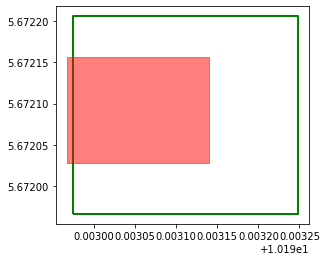

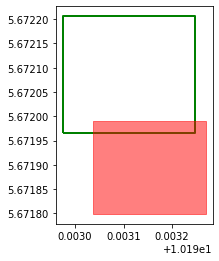

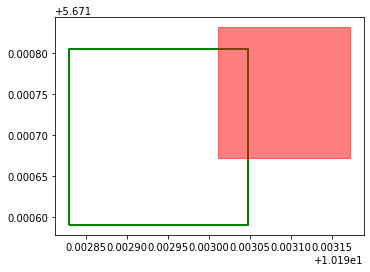

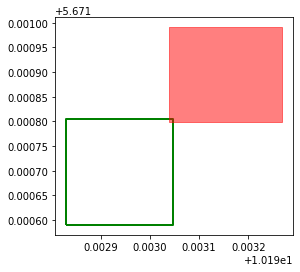

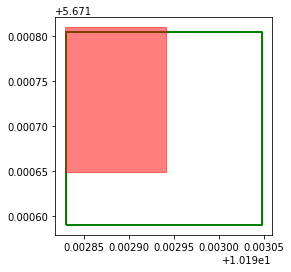

...

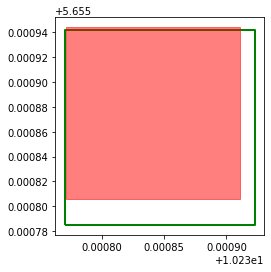

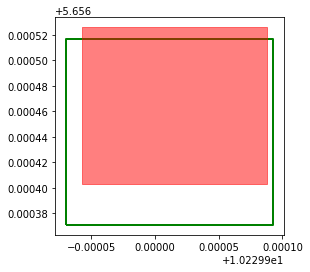

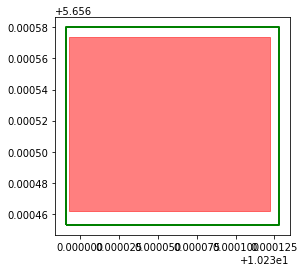

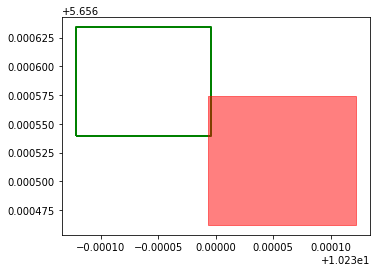

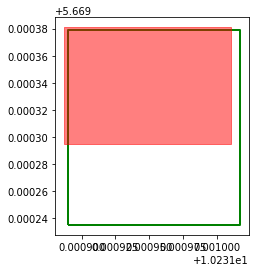

In [49]:

pred_geojson_path = "./ensemble/predictions/prediction-ensemble/merged_prediction_multi_heads_attention.geojson"
ref_geojson_path = "./evaluation/reference/building_building_.geojson"

start_time = time.time()
results = []
all_predictions_gdf = gpd.GeoDataFrame()
all_ref_gdf = gpd.GeoDataFrame()

pred_geojson = load_geojson(pred_geojson_path)
ref_geojson = load_geojson(ref_geojson_path)

IOU_THRESHOLD = 0.3
FILTER_THRESHOLD = 0.07
COVERAGE_THRESHOLD = 0.5

filtered_pred_geojson = prediction_filter_by_score(pred_geojson, FILTER_THRESHOLD)

pred_geodf = prediction_to_gdf(filtered_pred_geojson)
ref_geodf = reference_to_gdf(ref_geojson)

print("pred_geodf", pred_geodf)
print("ref_geodf", ref_geodf)

TP = 0

intersection_df = gpd.overlay(pred_geodf, ref_geodf, how='intersection')
print("intersection: \n", intersection_df)

for i, intersect in enumerate(intersection_df.itertuples()):
    pred_id = intersect.prediction_id
    ref_id = intersect.ref_id

    pred_item = pred_geodf.loc[pred_geodf['prediction_id'] == pred_id]
    ref_item = ref_geodf.loc[ref_geodf['ref_id'] == ref_id]
    iou = calculate_IOU(pred_item, ref_item)

#             print("iou:", iou)
    print(i, intersect)

#     print("pred contain ref",intersect.geometry.area/pred_item.geometry.area)
#     print("ref contain pred",intersect.geometry.area/ref_item.geometry.area)

    if iou >= IOU_THRESHOLD:
        pred_geodf.loc[pred_geodf['prediction_id'] == pred_id, 'if_correct'] = True #====> TP
        ref_geodf.loc[ref_geodf['ref_id'] == ref_id,'if_detected'] = True #====> TP
        TP += 1
    #  no TP, but prediction mostly covered by the ref building
    elif (intersect.geometry.area/pred_item.geometry.area).iloc[0] >= COVERAGE_THRESHOLD:
        pred_geodf.loc[pred_geodf['prediction_id'] == pred_id, 'if_correct'] = True #====> TP
        ref_geodf.loc[ref_geodf['ref_id'] == ref_id,'if_detected'] = True #====> TP
        TP += 1
    
    ax = ref_item.plot(linewidth = 2, color="white", edgecolor="green")
    ax2 = pred_item.plot(ax=ax, color="red", linewidth = 1, alpha=0.5, edgecolor="red")
    
    print(pred_geodf.loc[pred_geodf['prediction_id'] == pred_id, 'if_correct'])
    print(ref_geodf.loc[ref_geodf['ref_id'] == ref_id,'if_detected'])
#     break

total_pred = pred_geodf.shape[0]
total_ref = ref_geodf.shape[0]

FP = total_pred - TP
FN = ref_geodf.loc[ref_geodf['if_detected'] == False].shape[0]

print(f"metrics: TP = {TP}, FP = {FP}, FN = {FN}, ref_true = {ref_geodf.loc[ref_geodf['if_detected'] == True].shape[0]}")

ax = ref_geodf.plot(linewidth = 2, color="white", edgecolor="green")
ax2 = pred_geodf.plot(ax=ax, color="red", linewidth = 1, alpha=0.5, edgecolor="red")

all_predictions_gdf = pd.concat([all_predictions_gdf, pred_geodf])
all_ref_gdf = pd.concat([all_ref_gdf, ref_geodf])

print("time used: {}".format(time.time()-start_time))

In [51]:
precision = TP/total_pred 
recall = TP/(TP+FN)
f1 = 2*(precision*recall/(precision+recall))
accuracy = TP/(TP+FP+FN)
# mcc = (tn * tp - fn * fp) / math.sqrt((tp + fp)*(tp + fn)*(tn + fp)*(tn + fn))
print(f"metrics: TP = {TP}, FP = {FP}, FN = {FN}, total = {total_pred}, \nprecision = {precision}, recall = {recall}, f1 = {f1}， accuracy = {accuracy}")

metrics: TP = 1684, FP = 53, FN = 448, total = 1737, 
precision = 0.9694876223373633, recall = 0.7898686679174484, f1 = 0.8705091754975446， accuracy = 0.7707093821510298


In [39]:
prediction_dir = "./ensemble/predictions/prediction-ensemble/json_multi_heads_attention/"
reference_dir = "./evaluation/reference/tile/"

# pred_Path = "./evaluation/prediction/merged_prediction_distance.geojson"
# ref_Path = "./evaluation/reference/building_building_.geojson"

pred_geojson_paths = load_path(prediction_dir)
ref_geojson_paths = load_path(reference_dir)

IOU_THRESHOLD = 0.3
FILTER_THRESHOLD = 0.07
COVERAGE_THRESHOLD = 0.5

results = []
all_predictions_gdf = gpd.GeoDataFrame()
all_ref_gdf = gpd.GeoDataFrame()

# for i, pred_path in enumerate(pred_geojson_paths):
#######################################################################
i = 15

tile_id = os.path.splitext(os.path.basename(pred_path))[0]
print("======================evaluation for ......", i, tile_id)
pred_geojson = load_geojson(pred_geojson_paths[i])
ref_geojson = load_geojson(ref_geojson_paths[i])

#     print("pred geojson:", len(pred_geojson['features']))
#     print("\nref geojson:", ref_geojson['features'])

filtered_pred_geojson = prediction_filter_by_score(pred_geojson, FILTER_THRESHOLD)

pred_geodf = prediction_to_gdf(filtered_pred_geojson)
ref_geodf = reference_to_gdf(ref_geojson)

print("pred geodf: \n", pred_geodf)
print("ref geodf: \n", ref_geodf)
TP = 0

# intersction gdf
if pred_geodf.shape[0] != 0 and ref_geodf.shape[0]!= 0:
    intersection_df = gpd.overlay(pred_geodf, ref_geodf, how='intersection', keep_geom_type=False)
    print("intersection: \n", intersection_df)

#     print("intersection from gdf1: \n", pred_geodf.loc[intersection_df['prediction_id']])
#     print("intersection from gdf2: \n", ref_geodf.loc[intersection_df['ref_id']])

#     print(type(pred_geodf.loc[intersect_df['prediction_id']]))

    for i, intersect in enumerate(intersection_df.itertuples()):
#             print(f"intersect {i}======================================================================\n")
        pred_id = intersect.prediction_id
        ref_id = intersect.ref_id

        pred_item = pred_geodf.loc[pred_geodf['prediction_id'] == pred_id]
        ref_item = ref_geodf.loc[ref_geodf['ref_id'] == ref_id]
        iou = calculate_IOU(pred_item, ref_item)

#             print("iou:", iou)

    #     print("pred contain ref",intersect.geometry.area/pred_item.geometry.area)
    #     print("ref contain pred",intersect.geometry.area/ref_item.geometry.area)

        if iou >= IOU_THRESHOLD:
            pred_geodf.loc[pred_geodf['prediction_id'] == pred_id, 'if_correct'] = True #====> TP
            ref_geodf.loc[ref_geodf['ref_id'] == ref_id,'if_detected'] = True #====> TP
            TP += 1
        #  no TP, but prediction mostly covered by the ref building
        elif (intersect.geometry.area/pred_item.geometry.area).iloc[0] >= COVERAGE_THRESHOLD:
            pred_geodf.loc[pred_geodf['prediction_id'] == pred_id, 'if_correct'] = True #====> TP
            ref_geodf.loc[ref_geodf['ref_id'] == ref_id,'if_detected'] = True #====> TP
            TP += 1


total_pred = pred_geodf.shape[0]
total_ref = ref_geodf.shape[0]

FP = total_pred - TP
FN = ref_geodf.loc[ref_geodf['if_detected'] == False].shape[0]

print(f"metrics: TP = {TP}, FP = {FP}, FN = {FN}, ref_true = {ref_geodf.loc[ref_geodf['if_detected'] == True].shape[0]}")

print("pred geodf 22222: \n", pred_geodf)
print("ref geodf 22222: \n", ref_geodf)   
#     print("ref count", )
ax = ref_geodf.plot(linewidth = 2, color="white", edgecolor="green")
ax2 = pred_geodf.plot(ax=ax, color="red", linewidth = 1, alpha=0.5, edgecolor="red")


all_predictions_gdf = pd.concat([all_predictions_gdf, pred_geodf])
all_ref_gdf = pd.concat([all_ref_gdf, ref_geodf])

#     print("all pred geodf: \n", all_predictions_gdf)
#     print("all ref geodf: \n", all_ref_gdf)   

tile_result = {
    "tile_id": tile_id,
    "total_pred": total_pred,
    "TP": TP,
    "FP": FP,
    "FN": FN
}
#     #######################################################################################
#     break
#     input("Press Enter to continue...")
#     results.append(tile_result)


======================evaluation for ...... 15 18.138494.126935
pred geodf: 
             task_id     score  prediction_id     type  if_correct  \
0  18.138495.126940  0.957655              0  Polygon       False   
1  18.138495.126940  0.947283              1  Polygon       False   
2  18.138495.126940  0.893495              2  Polygon       False   
3  18.138495.126940  0.892439              3  Polygon       False   
4  18.138495.126940  0.853937              4  Polygon       False   
5  18.138495.126940  0.612199              5  Polygon       False   
6  18.138495.126940  0.320800              6  Polygon       False   
7  18.138495.126940  0.261641              7  Polygon       False   
8  18.138495.126940  0.235683              8  Polygon       False   

                                            geometry  
0  POLYGON ((10.19512 5.66443, 10.19526 5.66443, ...  
1  POLYGON ((10.19448 5.66429, 10.19462 5.66429, ...  
2  POLYGON ((10.19471 5.66428, 10.19486 5.66428, ...  
3  POLYGON 

In [15]:
import math
print(len(results))
tp = 0
fp = 0
fn = 0
tn = 0
total_pred = 0
for tile_result in results:
    # print("tile id", tile_result['tile_id'])
    tp += tile_result['TP']
    fp += tile_result['FP']
    fn += tile_result['FN']
    total_pred += tile_result['total_pred']

precision = tp/total_pred 
recall = tp/(tp+fn)
f1 = 2*(precision*recall/(precision+recall))
accuracy = tp/(tp+fp+fn)
mcc = (tn * tp - fn * fp) / math.sqrt((tp + fp)*(tp + fn)*(tn + fp)*(tn + fn))
print(f"metrics: TP = {tp}, FP = {fp}, FN = {fn}, total = {total_pred}, \nprecision = {precision}, recall = {recall}, f1 = {f1}， accuracy = {accuracy}")

343
metrics: TP = 1662, FP = 75, FN = 798, total = 1737, 
precision = 0.9568221070811744, recall = 0.675609756097561, f1 = 0.7919942816297355， accuracy = 0.6556213017751479


In [6]:
metrics = {
    "TP": tp,
    "FP": fp,
    "FN": fn,
    "total_pred": total_pred,
    "precision": precision,
    "recall": recall,
    "accuracy": accuracy,
    "f1": f1
}
print(metrics)

{'TP': 1662, 'FP': 75, 'FN': 798, 'total_pred': 1737, 'precision': 0.9568221070811744, 'recall': 0.675609756097561, 'accuracy': 0.6556213017751479, 'f1': 0.7919942816297355}


In [50]:
print("all pred geodf: \n", all_predictions_gdf)
print("all ref geodf: \n", all_ref_gdf)   
all_predictions_gdf.to_file("./evaluation/all_predictions_eval_all.geojson", driver="GeoJSON")  
all_ref_gdf.to_file("./evaluation/all_reference_eval_all.geojson", driver="GeoJSON")  

all pred geodf: 
                task_id     score  prediction_id     type  if_correct  \
0     18.138494.126934  0.080912              0  Polygon        True   
1     18.138494.126935  0.962957              1  Polygon        True   
2     18.138494.126935  0.857490              2  Polygon        True   
3     18.138494.126935  0.747513              3  Polygon        True   
4     18.138494.126935  0.545376              4  Polygon        True   
...                ...       ...            ...      ...         ...   
1732  18.138524.126945  0.080254           1732  Polygon        True   
1733  18.138524.126946  0.999163           1733  Polygon        True   
1734  18.138524.126946  0.774584           1734  Polygon        True   
1735  18.138524.126946  0.744504           1735  Polygon        True   
1736  18.138524.126946  0.549584           1736  Polygon        True   

                                               geometry  
0     POLYGON ((10.19297 5.67216, 10.19314 5.67216, ...  
1